# Исследование рынка заведений общественного питания Москвы

**Цель исследования** -  найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего места для открытия заведения общественного питания в Москве.

**Заказчик исследования** - фонд "Shut Up and Take My Money"

Исследование базируется на данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

## Обзор данных

**Описание данных**: 

- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
   - «Средний счёт: 1000–1500 ₽»;
   - «Цена чашки капучино: 130–220 ₽»;
   - «Цена бокала пива: 400–600 ₽».
   - и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:
   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
   - 0 — заведение не является сетевым
   - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

In [1]:
# Импортируем нужные библиотеки
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np 
from numpy import mean
from matplotlib.ticker import MultipleLocator
import plotly.express as px
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster

C:\Users\inna\.conda\envs\practicum\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# Зададим общий стиль всех графиков в проекте
plt.style.use('ggplot')

In [3]:
# Прочитаем csv-файл
data = pd.read_csv('moscow_places.csv')

In [4]:
# JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'

# Широта и долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


### **Вывод**
Из общей информации, выведенной методом `info()`, можно сделать следующие выводы:

1. В данном датафрейме представлена информация о 8406 заведениях общественного питания Москвы. 
2. Больше половины столбцов хранят информацию строкового типа, один столбец информацию типа "целое число", а остальные - вещественные числа. 
3. Столбец `seats` — количество посадочных мест, необходимо привести к типу  `int`, так как должно быть целое число.
4. В датасете имеются пропуски, которые будем обрабатывать на этапе предобработки.

## Предобработка данных

### Изменение типов данных

In [7]:
# Приведем данные в столбце seats к типу int64:
data['seats'] = data['seats'].astype ('int64', errors = 'ignore')
data['seats'].dtypes

dtype('float64')

Привели столбец `seats` (количество посадочных мест) к типу данных int64. 

### Обработка дубликатов

In [8]:
# Проверим наличие полных дубликатов, т.е. дубликатов по всем столбцам одновременно
data.duplicated().sum()

0

Полные дубликаты отсутствуют

#### Неявные дубликаты категории заведения

In [9]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Неявные дубликаты в категории заведения не обнаружены.

#### Неявные дубликаты категории цен

In [10]:
data['price'].value_counts()

средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64

Неявные дубликаты в категории цен в заведении не обнаружены.

#### Неявные дубликаты в названиях административных районов

In [11]:
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

Неявные дубликаты в названиях административных районов не обнаружены.

#### Неявные дубликаты в названии и адресе заведений

In [12]:
# Приведем к нижнему регистру название заведений и их адрес для дальнейшей проверки на неявные дубликаты
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data[['name', 'address']]

,name,address
0,wowфли,"москва, улица дыбенко, 7/1"
1,четыре комнаты,"москва, улица дыбенко, 36, корп. 1"
2,хазри,"москва, клязьминская улица, 15"
3,dormouse coffee shop,"москва, улица маршала федоренко, 12"
4,иль марко,"москва, правобережная улица, 1б"
...,...,...
8401,суши мания,"москва, профсоюзная улица, 56"
8402,миславнес,"москва, пролетарский проспект, 19, корп. 1"
8403,самовар,"москва, люблинская улица, 112а, стр. 1"
8404,чайхана sabr,"москва, люблинская улица, 112а, стр. 1"


In [13]:
# Посчитаем количество дубликатов одновременно по названию и адресу заведения
dublicates_filter = data.duplicated(subset=['name', 'address'])
dublicates_filter.sum()

4

In [14]:
# Посмотрим на найденные дубликаты
data[dublicates_filter]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [15]:
# Удалим дуликаты 
data.drop(data[dublicates_filter].index, inplace = True)

In [16]:
# Убедимся. что дубликаты удалены
data.duplicated(subset=['name', 'address']).sum()

0

### Обработка пропусков

In [17]:
# Вычислим контрольный размер датасета до преобразования
len(data)

8402

In [18]:
# Выведем количество пропущенных значений для каждого столбца
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Из выведенной информации видно, что пропусков очень много. Больше всего пропусков в столбце со средним чеком чашки кофе. Как в этом столбце, так и в остальных мы не можем предложить логичную замену пропусков. Удалить такое количество данных мы не можем. Поэтому будем анализировать имеющиеся данные.

### Создание новых столбцов 

#### Новый столбец с названием улицы

In [19]:
# Посмотрим, в каком формате записываются адреса заведений
data['address'].head()

0             москва, улица дыбенко, 7/1
1     москва, улица дыбенко, 36, корп. 1
2         москва, клязьминская улица, 15
3    москва, улица маршала федоренко, 12
4        москва, правобережная улица, 1б
Name: address, dtype: object

Части адреса разделены запятой, а название улицы указвается на втором месте

In [20]:
# Создадим функцию, которая выведет второе значения из списка
def get_second_value(values_str):
    result = values_str.split(', ')
    return result[1].strip()
    
# Создадим столбец с названиями улиц из столбца с адресом
data['street'] = data['address'].apply(get_second_value) 
data['street'].head()

0              улица дыбенко
1              улица дыбенко
2         клязьминская улица
3    улица маршала федоренко
4        правобережная улица
Name: street, dtype: object

#### Новый столбец с признаком круглосуточной работы

In [21]:
data['hours'].head(10)

0                               ежедневно, 10:00–22:00
1                               ежедневно, 10:00–22:00
2    пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...
3                               ежедневно, 09:00–22:00
4                               ежедневно, 10:00–22:00
5                               ежедневно, 10:00–23:00
6                    пн 15:00–04:00; вт-вс 15:00–05:00
7    пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...
8                               ежедневно, 10:00–22:00
9                               ежедневно, 12:00–00:00
Name: hours, dtype: object

In [22]:
# Создадим функцию, которая определяет круглосуточное заведение
def is_24_7_value(values_str):
    return values_str == 'ежедневно, круглосуточно'
    
# Создадим  столбец с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24_7'] = data['hours'].apply(is_24_7_value) 
data[['is_24_7', 'hours']].head(15)

,is_24_7,hours
0,False,"ежедневно, 10:00–22:00"
1,False,"ежедневно, 10:00–22:00"
2,False,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00..."
3,False,"ежедневно, 09:00–22:00"
4,False,"ежедневно, 10:00–22:00"
5,False,"ежедневно, 10:00–23:00"
6,False,пн 15:00–04:00; вт-вс 15:00–05:00
7,False,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00..."
8,False,"ежедневно, 10:00–22:00"
9,False,"ежедневно, 12:00–00:00"


### Проверка количественных значений

#### Общая статистики

In [23]:
# Просмотрим общую статистику по всем количественным значениям
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8402.000000,8402.000000,8402.000000,3149.000000,535.000000,8402.000000,4792.000000
mean,55.750080,37.608613,4.230017,958.053668,174.721495,0.381219,108.361436
std,0.069654,0.098585,0.470320,1009.732845,88.951103,0.485715,122.841130
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.704950,37.538653,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753401,37.605263,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795017,37.664819,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


По выеденной информации видно следующее:

- 75% заведений имеют рейтинг выше 4, что кажется вполне логичным 
- минимальный средний чек 0 руб. - ниже изучим этот вопрос отдельно
- максимальное значение цены за чашку кофе - 1568руб. - это подозрительно

#### Средний чек

In [24]:
# Посчитаем количество заведерний с нулевым средним чеком
data.loc[data['middle_avg_bill'] == 0, 'middle_avg_bill'].count()

1

Как видим, всего одно заведение с нулевым средним чеком. Эту строку можно смело удалять. 

In [25]:
# Удалим строку со значением ноль
data = data.drop(np.where(data ['middle_avg_bill']==0)[0])

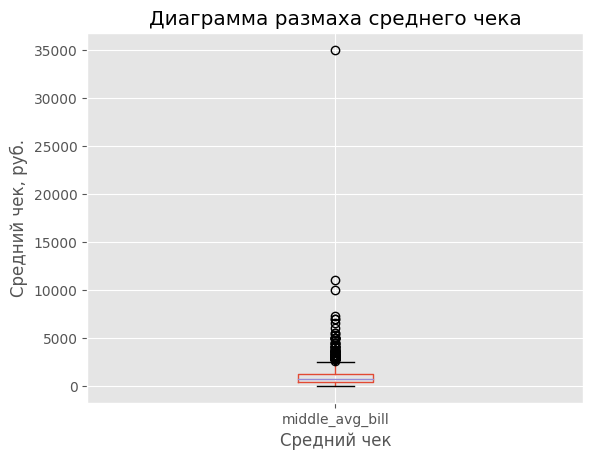

In [26]:
# Выведем диаграмму размаха для среднего чека 
data.boxplot(column=['middle_avg_bill'])
plt.title('Диаграмма размаха среднего чека')
plt.ylabel('Средний чек, руб.')
plt.xlabel("Средний чек")
plt.show()

In [27]:
# Посчитаем границы нормальных значений среднего чека
Q1 = data['middle_avg_bill'].quantile(0.25)  # первый квартиль
Q3 = data['middle_avg_bill'].quantile(0.75)  # третий квартиль
min_value = data['middle_avg_bill'].min()    # минимальное значение
max_value = data['middle_avg_bill'].max()    # максимельное значение

IQR = Q3 - Q1  # межквартильный размах

# левая граница нормальных значений
left = Q1 - 1.5 * IQR
if left > min_value:
    left = left
else:
    left = min_value

# правая граница нормальных значений
right = Q3 + 1.5 * IQR  
if right > max_value:
    right = max_value
else:
    right = right    

print(f"Границы нормальных значений: {left:.2f}, {right:.2f}")

Границы нормальных значений: 0.00, 2562.50


In [28]:
# Посчитаем процентное содержание строк со значениями, превышающие нормальные границы
count_bad_avg_bill = data.loc[data['middle_avg_bill'] > 2562.50, 'middle_avg_bill'].count()
count_places = data.shape[0]
print('Доля заведений с аномальным средним чеком:',  count_bad_avg_bill / count_places * 100)

Доля заведений с аномальным средним чеком: 1.2379478633496013


Из расчетов видно, что заведений со средним чеком выше 2562,5 руб. всего 1,2 %. Если их удалить, расчеты не сильно исказяться. 

In [29]:
# Удалим из датасета строки с выбросами:
data = data.drop(np.where(data['middle_avg_bill']>2562.50)[0])

#### Стоимость одной чашки капучино

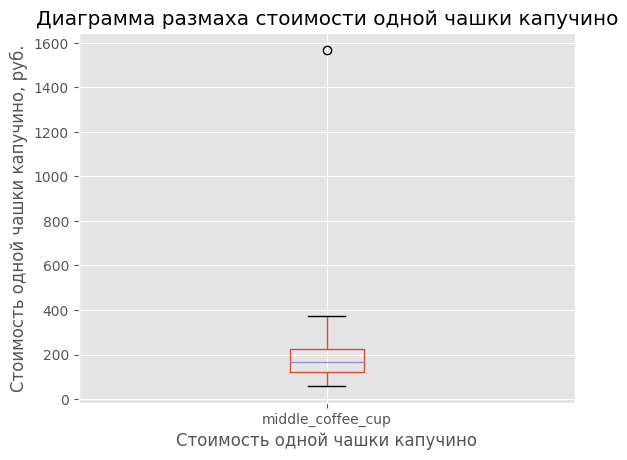

In [30]:
# Выведем диаграмму размаха для среднего чека одной чашки капучино
data.boxplot(column=['middle_coffee_cup'])
#plt.ylim(0, 80000000)
plt.title('Диаграмма размаха стоимости одной чашки капучино')
plt.ylabel('Стоимость одной чашки капучино, руб.')
plt.xlabel("Стоимость одной чашки капучино")
plt.show()

In [31]:
# Посчитаем границы нормальных значений среднего чека одной чашки капучино
Q1 = data['middle_coffee_cup'].quantile(0.25)  # первый квартиль
Q3 = data['middle_coffee_cup'].quantile(0.75)  # третий квартиль
min_value = data['middle_coffee_cup'].min()    # минимальное значение
max_value = data['middle_coffee_cup'].max()    # максимельное значение

IQR = Q3 - Q1  # межквартильный размах

# левая граница нормальных значений
left = Q1 - 1.5 * IQR
if left > min_value:
    left = left
else:
    left = min_value

# правая граница нормальных значений
right = Q3 + 1.5 * IQR  
if right > max_value:
    right = max_value
else:
    right = right    

print(f"Границы нормальных значений: {left:.2f}, {right:.2f}")

Границы нормальных значений: 60.00, 376.50


In [32]:
# Выведем заведения со стоимостью чашки капучино, превышающей нормальное значение:
data[data ['middle_coffee_cup'] > 376.5]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
2859,шоколадница,кофейня,"москва, большая семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0,большая семёновская улица,False


В датафрейме нашлась всего одна строка, и если внимательно посмотреть, то видно, что здесь была допущена опечатка. Поэтому необходимо исправить верхнюю границу диапозона цены.

In [33]:
# Исправим опечатки в столбцах avg_bill и middle_coffee_cup:
data.loc[2859, 'avg_bill'] = 'Цена чашки капучино:230–290 ₽'
data.loc[2859, 'middle_coffee_cup'] = 260

In [34]:
# Убедимся, что строки со стоимостью чашки капучино, превышающей нормальное значение, теперь отсутствуют:
data[data ['middle_coffee_cup'] > 375.38]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7


### **Вывод**

На этапе предобработки данных была проделана следующая работа:

1. **Проверили типы данных и преобразовали их там, где это было необходимо**: <br>привели столбец 'seats'(количество посадочных мест) к типу данных int64.<br><br>

2. **Изучили дубликаты в датафрейме**:
- полные дубликаты отсутствовали
- неявные дубликаты в категории заведения не обнаружили
- неявные дубликаты в категории цен в заведении не обнаружили.
- неявные дубликаты в названиях административных районов не обнаружили
- нашли и удалили неявные дубликаты в названии и адресе заведений

3. **Изучили пропуски в датасете**:
- пропуски были обнаружены в столбцах: 'hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats'. 
- больше всего пропусков в столбце со средним чеком чашки кофе. 
- предложить логичную замену пропусков в столбцах не предоставляется возможным, поэтому на следующем этапе будем анализировать данные без изменений

4. **Создали новые столбцы**:
- `street` - столбец с названиями улиц из столбца с адресом
- `is_24_7` - столбец с признаком круглосуточной ежедневной работы заведения (24/7)

5. **Проверили количественные значения**:

- 75% заведений имеют рейтинг выше 4, что кажется вполне логичным 
- удалили строку с нулевым средним чеком
- удалили строки с выбросами, которые были обнаружены после расчетов "Доли заведений с аномальным средним чеком" 
- исправили обнаруженную одну опечатку в вехней границы диапозона цены чашки капучино.


## Анализ данных

### Проанализируем категории заведений

In [35]:
# Посмотрим количество объектов общественного питания по категориям
data['category'].value_counts()

кафе               2352
ресторан           2015
кофейня            1396
бар,паб             743
пиццерия            627
быстрое питание     598
столовая            312
булочная            254
Name: category, dtype: int64

In [36]:
# Посмотрим количество объектов общественного питания по категориям
place_category_counts = data.loc[:, 'category'].value_counts().to_frame(name='column_name').reset_index()
place_category_counts.columns = ['Категория', 'Кол-во заведений']
place_category_counts

,Категория,Кол-во заведений
0,кафе,2352
1,ресторан,2015
2,кофейня,1396
3,"бар,паб",743
4,пиццерия,627
5,быстрое питание,598
6,столовая,312
7,булочная,254


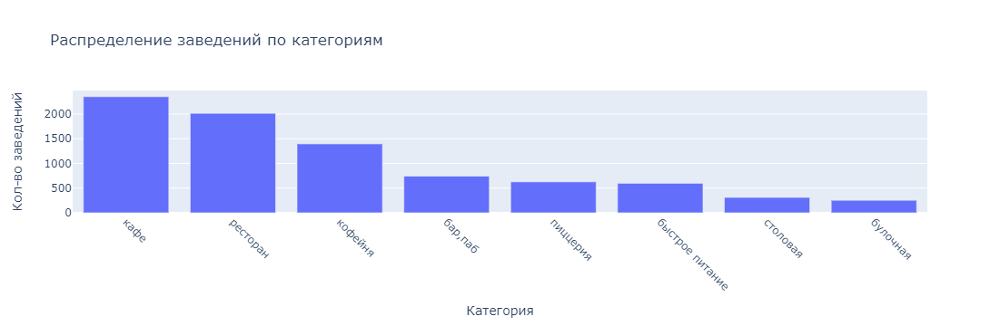

In [37]:
# Построим столбчатую диаграмму 
fig = px.bar(place_category_counts, x='Категория', y='Кол-во заведений', title='Распределение заведений по категориям')        
fig.update_xaxes(tickangle=45)
fig.show()

На диаграмме наблюдается следующее распределение категорий заведений:
- бОльшая часть заведений приходится на кафе и рестораны и кофейни - более 1000 заведений в каждой категории
- затем идут бары, пицерии и быстрое питание - более 500 заведений в каждой категории
- меньше 500 заведений в категориях столовая и булочная

### Анализ количества посадочных мест

In [38]:
# Выведем общую статистическую информацию о количестве посадочных мест
data['seats'].describe()

count    4743.000000
mean      108.333122
std       123.094185
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

In [39]:
# Посчитаем медианное значение посадочных мест для каждой категории
seats_counts_category = data.pivot_table(
    index= 'category', values= 'seats', aggfunc='median').sort_values(by=['seats'], ascending=False).reset_index()
seats_counts_category.columns = ['Категория', 'Кол-во мест']
display(seats_counts_category)

,Категория,Кол-во мест
0,ресторан,86.0
1,"бар,паб",84.0
2,кофейня,80.0
3,столовая,76.0
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,52.0
7,булочная,50.0


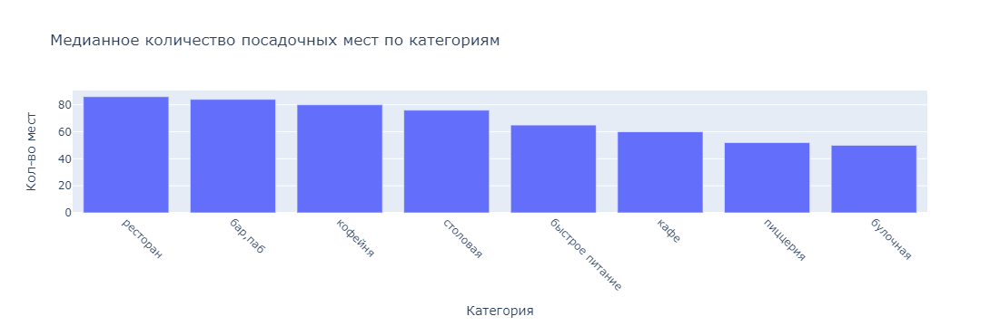

In [40]:
# Построим столбчатую диаграмму 
fig = px.bar(seats_counts_category, x='Категория', y='Кол-во мест', title='Медианное количество посадочных мест по категориям')        
fig.update_xaxes(tickangle=45)
fig.show() 

По графику и выведенной информации мы видим:

- больше всего посадочных мест в ресторанах, что вполне логично, так как посетители могут и поесть и отдохнуть
- незначительно уступают по количеству посадочных мест бары и кофейни
- меньше всего посадочных мест в булочных и пиццериях. Видимо, они рассчитаны на крастковременное пребывание посетителей

### Рассмотрим соотношение сетевых и несетевых заведений

In [41]:
# Посчитаем количество сетевых и несетевых ресторанов
chain_counts = data.pivot_table(index='chain', values='name', aggfunc='count').reset_index()
display(chain_counts)

,chain,name
0,0,5138
1,1,3159


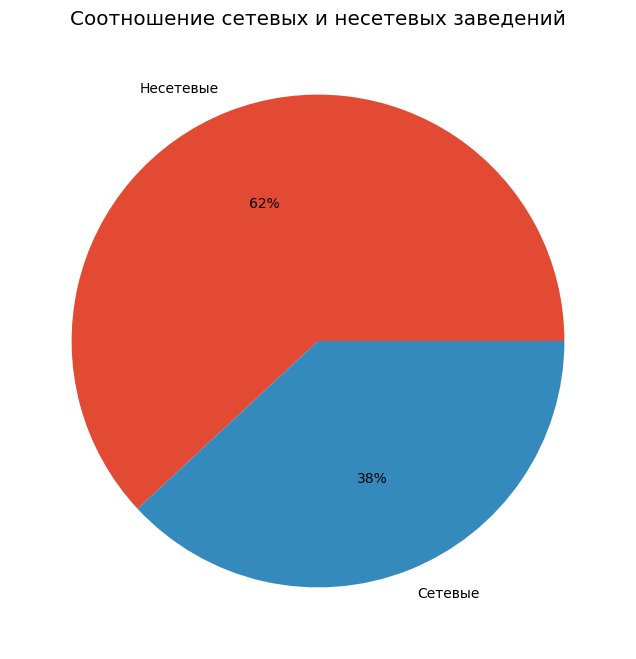

In [42]:
# Построим круговую диаграмму
data.loc[:, 'chain'].value_counts().plot.pie(figsize=(8, 8), labels = ['Несетевые', 'Сетевые'], autopct='%1.0f%%')
plt.title('Соотношение сетевых и несетевых заведений')
plt.ylabel('')
plt.show()

По графику и выведенной информации мы видим, что несетевых заведений общественного питания гораздо больше (62%), чем сетевых (38%).

### Исследуем какие категории заведений чаще являются сетевыми

In [43]:
# Посчитаем долю сетевых и несетевых заведений в разрезе категорий
category_chain = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count').reset_index()
category_chain.columns = ['Категория', 'Не сетевые', 'Сетевые']
category_chain['Доля сетевых'] = category_chain['Сетевые'] / (category_chain['Сетевые'] + category_chain['Не сетевые'])
category_chain = category_chain.sort_values(by=['Доля сетевых'], ascending=False)
display(category_chain)

,Категория,Не сетевые,Сетевые,Доля сетевых
1,булочная,98,156,0.614173
5,пиццерия,300,327,0.521531
4,кофейня,687,709,0.507880
2,быстрое питание,369,229,0.382943
6,ресторан,1297,718,0.356328
3,кафе,1581,771,0.327806
7,столовая,225,87,0.278846
0,"бар,паб",581,162,0.218035


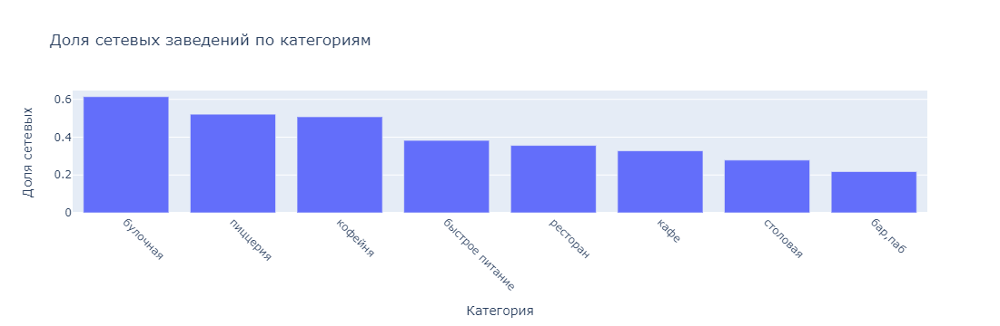

In [44]:
# Построим столбчатую диаграмму 
fig = px.bar(category_chain, x='Категория', y='Доля сетевых', title='Доля сетевых заведений по категориям')        
fig.update_xaxes(tickangle=45)
fig.show() 

Для рынка общественного питания Москвы характерно следующее распределение сетевых заведений по категориям:
- чаще всего сетевыми бывают такие категории как - булочная, пицерия и кофейня, но относительная разница не сильно большая
- наиболее редко, сетевые заведения встречаются в категориях быстрого питания, ресторанах, кафе, столовых и баров

### Топ-15 популярных сетей в Москве

In [45]:
# Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве
top_15 = pd.DataFrame(data.loc[data['chain'] == 1, :] \
                        .groupby(['name','category'], as_index=False) \
                        .count() \
                        .sort_values(by='address', ascending=False) \
                        .head(15)
                      )[['name', 'category', 'address']]
top_15.columns = ['Название сети', 'Категория', 'Кол-во заведений']
top_15.reset_index(drop=True, inplace=True)
display(top_15)

,Название сети,Категория,Кол-во заведений
0,шоколадница,кофейня,115
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,69
4,яндекс лавка,ресторан,69
5,cofix,кофейня,64
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,38
9,теремок,ресторан,36


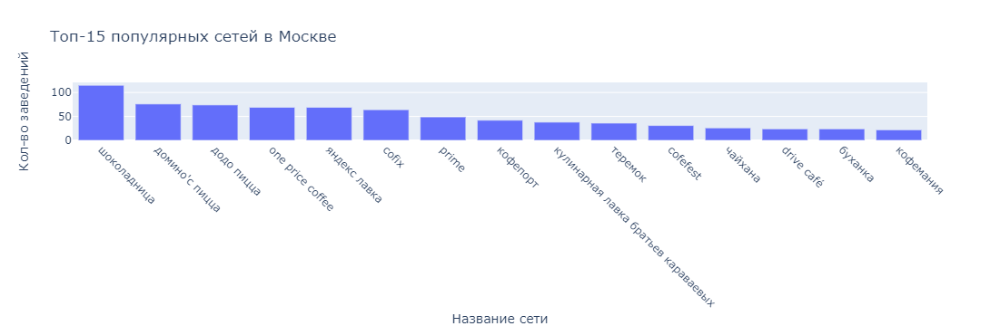

In [46]:
fig = px.bar(top_15, x='Название сети', y='Кол-во заведений', title='Топ-15 популярных сетей в Москве')        
fig.update_xaxes(tickangle=45)
fig.show() 

- Самым популярным заведением в Москве является - сеть кофеен "Шоколадница". У данной сети 115 заведений.
- Второе и третье место в рейтинге занимают пиццерии - "Домино'с Пицца"(76 заведений) и "Додо Пицца"(74 заведения).
- Последнее место в топе-15 занимает сеть кофеен "Кофемания".

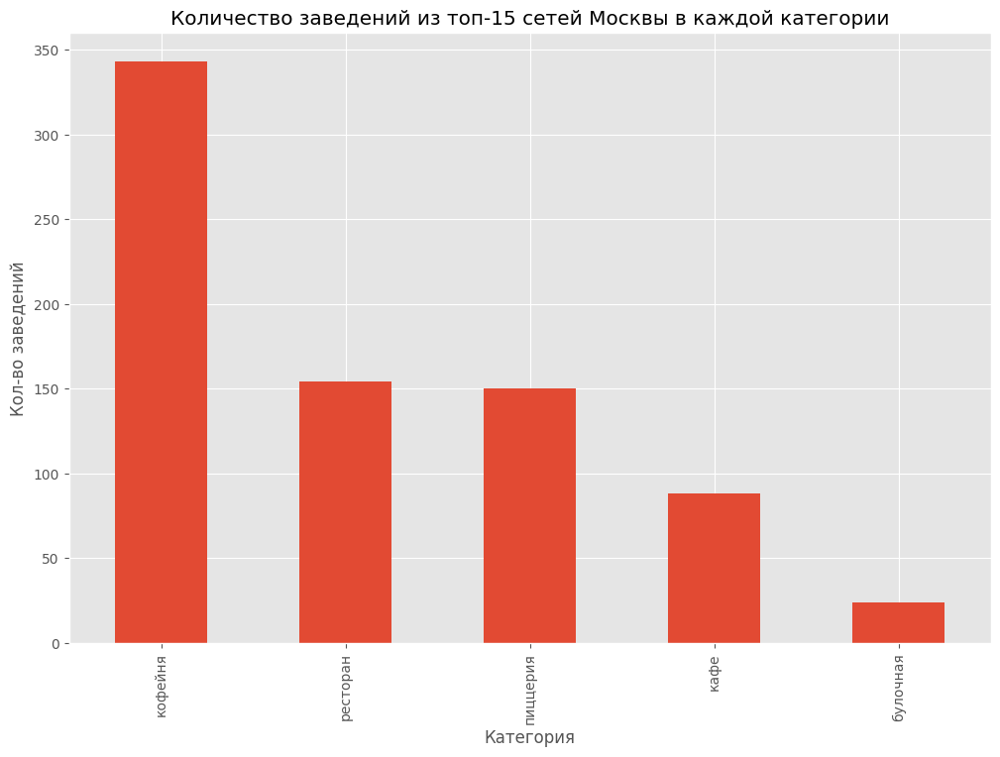

In [47]:
# Посчитаем количество заведений из топ-15 сетей Москвы в каждой категории
top_15.groupby('Категория')['Кол-во заведений'].sum().sort_values(ascending=False).plot(
    kind='bar', grid=True, figsize=(12,8),
    x='Категория',
    xlabel='Категория',
    ylabel='Кол-во заведений')
plt.title ('Количество заведений из топ-15 сетей Москвы в каждой категории');

Как видим, больше всего из топ-15 на рынке присутствуют заведения из категории "кофейня".

### Рассмотрим общее количество заведений и количество заведений каждой категории по районам

In [48]:
# Рассмотрим какие административные районы Москвы присутствуют в датасете
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [49]:
# Посчитаем общее количество заведений по районам
total = data.groupby('district')['name'].count().sort_values(ascending=False)
total

district
Центральный административный округ         2175
Северный административный округ             891
Южный административный округ                888
Северо-Восточный административный округ     886
Западный административный округ             842
Восточный административный округ            796
Юго-Западный административный округ         708
Юго-Восточный административный округ        705
Северо-Западный административный округ      406
Name: name, dtype: int64

In [50]:
# Создадим сводную таблицу по округам Москвы с количеством заведений в каждой категории
places_by_district_tbl = data.pivot_table(index='district', columns='category', values='name', aggfunc='count').reset_index()
places_by_district_tbl

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,272,105,71,159,40
1,Западный административный округ,50,36,62,237,147,71,215,24
2,Северный административный округ,65,39,58,234,191,77,187,40
3,Северо-Восточный административный округ,61,28,81,268,158,68,182,40
4,Северо-Западный административный округ,23,12,30,112,62,40,109,18
5,Центральный административный округ,351,50,83,449,422,108,648,64
6,Юго-Восточный административный округ,36,12,67,278,87,55,145,25
7,Юго-Западный административный округ,38,27,61,238,95,64,168,17
8,Южный административный округ,66,25,85,264,129,73,202,44


In [51]:
# Подготовим данные для удобства визуализации
places_by_district_fig = pd.DataFrame(data.groupby(['district','category'], as_index=False).count() \
                        .sort_values(by='name', ascending=False))[['district', 'category', 'name']]
places_by_district_fig.columns = ['Район', 'Категория', 'Количество']
places_by_district_fig.reset_index(drop=True,inplace=True)
places_by_district_fig

,Район,Категория,Количество
0,Центральный административный округ,ресторан,648
1,Центральный административный округ,кафе,449
2,Центральный административный округ,кофейня,422
3,Центральный административный округ,"бар,паб",351
4,Юго-Восточный административный округ,кафе,278
...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Северо-Западный административный округ,булочная,12


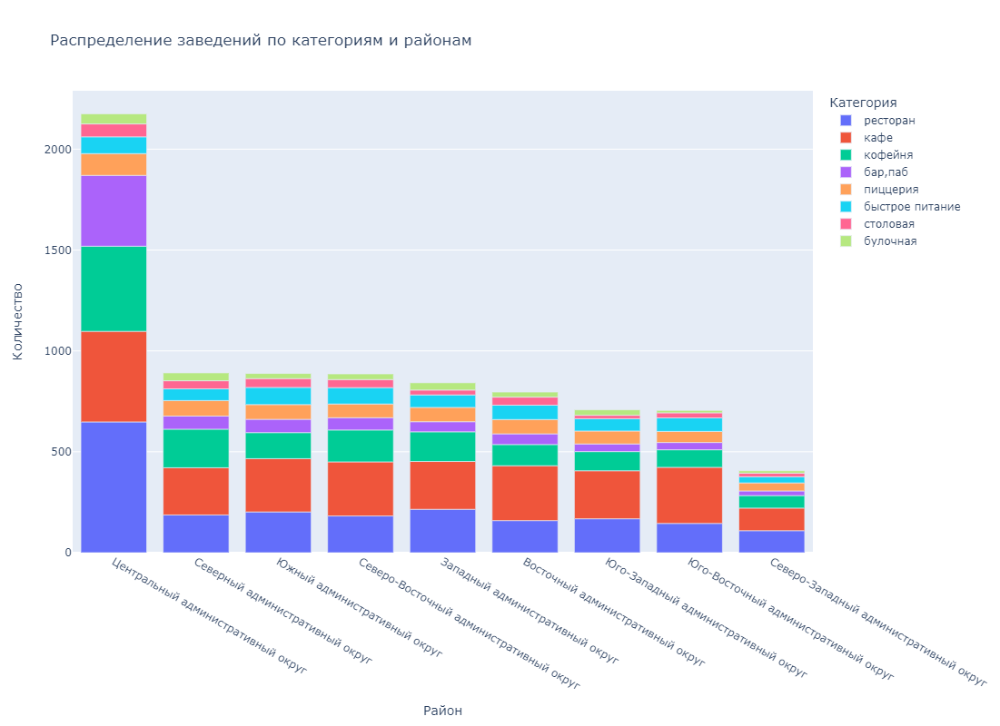

In [52]:
# Построим столбчатую диаграмму с накоплением для визуализации распределения заведений по категориям и районам
fig = px.bar(
    places_by_district_fig, x="Район", y="Количество", color="Категория", 
    width=950, height=800, title="Распределение заведений по категориям и районам")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

По графику можно сделать следующие выводы: 
- лидером по количеству заведений является ЦАО. Также в данном округе представлены все категории, но больше всего ресторанов, кафе и кофеен. Кроме того, в ЦАО больше всего баров, по сравнению с другими районами. Это объясняется тем, что Центральный административный округ - это основное место скопления туристов.
- приблизительно одинаково распредидились по количеству заведений места у ЮАО, САО и СВАО
- меньше всего заведений общепита находится в СЗАО, причем преобладают здесь кафе (112 заведений) и рестораны (109 заведений)
- почти одинаковое количество заведений быстрого питания имеется во всех районах, за исключением Северо-Западного административного округа

### Распределение средних рейтингов по категориям заведений

In [53]:
# Сгруппируем по категории и посчитаем средний рейтинг в каждой категории
category_rating_avg = data.groupby('category')['rating'].mean().sort_values(ascending=False).to_frame()
category_rating_avg.reset_index(inplace=True)
category_rating_avg

,category,rating
0,"бар,паб",4.384657
1,пиццерия,4.300159
2,ресторан,4.287593
3,кофейня,4.277436
4,булочная,4.264567
5,столовая,4.210256
6,кафе,4.122449
7,быстрое питание,4.050334


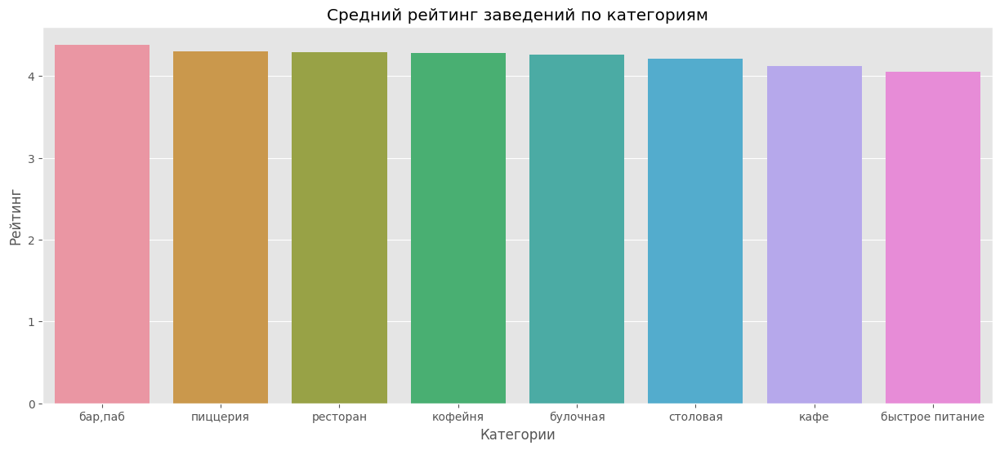

In [54]:
# Построим график распределения средних рейтингов по категориям заведений
ax = sns.barplot(x='category', y='rating', data=category_rating_avg) 
plt.xlabel("Категории")
plt.ylabel("Рейтинг")
plt.title("Средний рейтинг заведений по категориям")
ax.figure.set_size_inches(15, 6)

График показывает следующее:
- средний рейтинг заведений по категориям не сильно отличается 
- разброс значений рейтинга практически отсутствует
- максимальное значение среднего рейтинга у баров - 4.38
- минимальное значение среднего рейтинга у заведений быстрого питания - 4

### Фоновая картограмма со средним рейтингом заведений каждого района

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [55]:
# Сгруппируем по категории и посчитаем средний рейтинг в каждой категории
rating_by_district = pd.DataFrame(data.groupby('district', as_index=False).mean())[['district', 'rating']]
rating_by_district = rating_by_district.sort_values(by='rating', ascending=False)
rating_by_district

,district,rating
5,Центральный административный округ,4.375080
2,Северный административный округ,4.239731
4,Северо-Западный административный округ,4.208128
8,Южный административный округ,4.183559
1,Западный административный округ,4.180166
0,Восточный административный округ,4.174372
7,Юго-Западный административный округ,4.172599
3,Северо-Восточный административный округ,4.150113
6,Юго-Восточный административный округ,4.098014


In [56]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,  # районы Москвы
    data=rating_by_district,  # рейтинг заведений
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

По выведенному хороплету можно сделать вывод:
- самый высокий рейтинг у заведений общественного питания в ЦАО - 4,38
- незначительно отличается рейтинг у заведений в САО и СЗАО - 4,24 и 4,21 соответственно
- самый низкий рейтинг у объектов в ЮВАО - 4,1

### Обозначим заведения  с помощью кластеров

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [57]:
# создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# создадим пустой кластер, добавим его на карту
marker_cluster = MarkerCluster().add_to(m)

# напишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применим функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводем карту
m

### Топ-15 улиц по количеству сетевых заведений

In [58]:
# Найдем топ-15 улиц по количеству заведений
top_15_streets = data.groupby('street')['name'].count().sort_values(ascending=False).head(15).reset_index()
top_15_streets = top_15_streets['street'].tolist()
top_15_streets

['проспект мира',
 'профсоюзная улица',
 'проспект вернадского',
 'ленинский проспект',
 'ленинградский проспект',
 'дмитровское шоссе',
 'каширское шоссе',
 'варшавское шоссе',
 'ленинградское шоссе',
 'мкад',
 'люблинская улица',
 'улица вавилова',
 'кутузовский проспект',
 'улица миклухо-маклая',
 'пятницкая улица']

In [59]:
top_15_streets_data = data.query('street in @top_15_streets') \
    .pivot_table(index='street', columns='category', values='address', aggfunc='count')
display(top_15_streets_data)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,23.0,4.0
каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
кутузовский проспект,2.0,1.0,2.0,14.0,11.0,3.0,16.0,3.0
ленинградский проспект,14.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
ленинградское шоссе,4.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,32.0,5.0
люблинская улица,5.0,NaN,5.0,26.0,10.0,1.0,10.0,2.0
мкад,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


In [60]:
# Подготовим данные для удобства визуализации
top_15_streets_fig = pd.DataFrame(data.query('street in @top_15_streets') \
                        .groupby(['street','category'], as_index=False).count() \
                        .sort_values(by='address', ascending=False)                        
                      )[['street', 'category', 'address']]
top_15_streets_fig.columns = ['Улица', 'Категория', 'Количество']
top_15_streets_fig.reset_index(drop=True, inplace=True)
display(top_15_streets_fig)

,Улица,Категория,Количество
0,проспект мира,кафе,52
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,35
4,профсоюзная улица,кафе,35
...,...,...,...
106,люблинская улица,пиццерия,1
107,проспект вернадского,булочная,1
108,мкад,столовая,1
109,кутузовский проспект,булочная,1


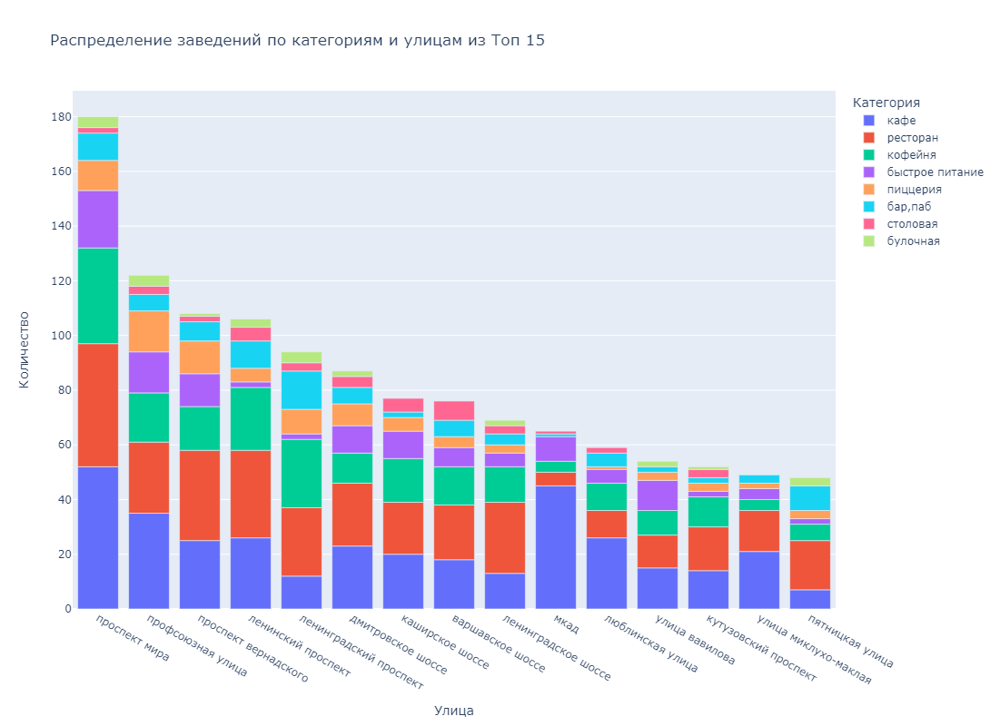

In [61]:
fig = px.bar(
    top_15_streets_fig, x="Улица", y="Количество", color="Категория", 
    width=950, height=800, title="Распределение заведений по категориям и улицам из Топ 15")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

По графику можно сделать следующий вывод:

- лидером по размещению объектов общепита стала такая крупная улица, как проспект Мира. Причем, если сравнивать ее с другими улицами, то здесь больше всего и кафе, и ресторанов и кофеен
- в топ-15 улиц вошли самые крупные транспортные артериии Москвы: шоссе, проспекты и улицы

### Улицы, на которых находится только один объект общепита

In [62]:
# Посчитаем количество заведений на каждой улице
places_count_by_street = data.groupby ('street')['name'].count().reset_index()
places_count_by_street.columns = ['street', 'count']
places_count_by_street

,street,count
0,1-й автозаводский проезд,1
1,1-й балтийский переулок,1
2,1-й варшавский проезд,1
3,1-й вешняковский проезд,1
4,1-й волоколамский проезд,3
...,...,...
1437,ясеневая улица,12
1438,ясногорская улица,2
1439,яузская улица,7
1440,яузский бульвар,2


In [63]:
# Создадим таблицу с данными об "одиноких" заведениях
lonely_places = places_count_by_street[places_count_by_street['count']==1]['street'].tolist()
lonely_places = data.query('street in @lonely_places')[['name', 'street', 'category','chain', 'lat', 'lng']]
lonely_places

,name,street,category,chain,lat,lng
15,дом обеда,улица бусиновская горка,столовая,0,55.885890,37.493264
21,7/12,прибрежный проезд,кафе,0,55.876805,37.464934
25,в парке вкуснее,парк левобережный,кофейня,1,55.878453,37.460028
58,coffeekaldi's,угличская улица,кофейня,1,55.900316,37.570558
60,чебуречная история,ландшафтный заказник лианозовский,кофейня,1,55.899845,37.570488
...,...,...,...,...,...,...
8289,мираж,улица шкулёва,ресторан,0,55.693340,37.746231
8294,wtfcoffee,улица артюхиной,кофейня,0,55.699044,37.737790
8317,беседка,кузьминская улица,кафе,1,55.690691,37.787735
8379,лагман хаус,новороссийская улица,кафе,1,55.678772,37.759422


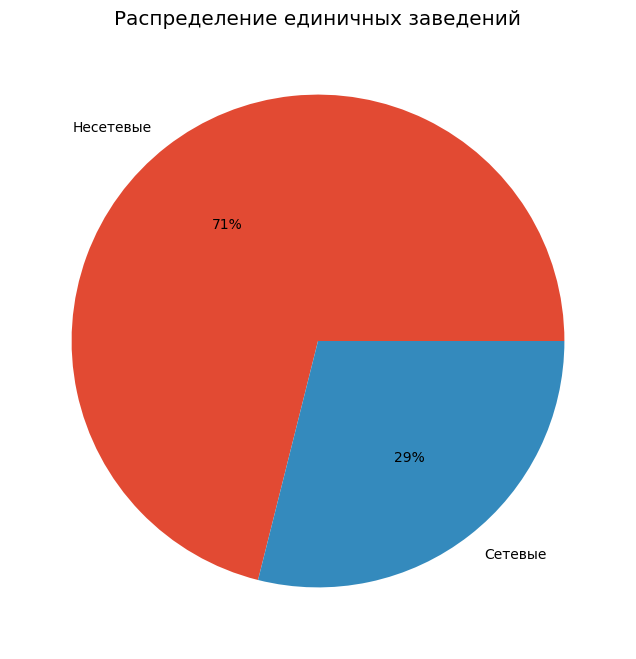

In [64]:
# Построим круговую диаграмму распределения единственных заведений общепита на улице по принадлежности к сети
lonely_places.groupby ('chain')['name'].count().plot(
    kind = 'pie', figsize = (12,8), autopct='%1.0f%%', labels = ['Несетевые', 'Сетевые'])
plt.title ('Распределение единичных заведений')
plt.ylabel('')
plt.show()

По графику видно, что единственные объекты общепита на улице в большинстве случаев являются несетевыми.

In [65]:
# Посмотрим к каким категориям относятся единичные заведения общепита
lonely_places_by_category = lonely_places.groupby('category')['name'].count().reset_index()
lonely_places_by_category.columns = ['category', 'count']
lonely_places_by_category = lonely_places_by_category.sort_values(by='count', ascending=False)
lonely_places_by_category

,category,count
3,кафе,158
6,ресторан,95
4,кофейня,86
0,"бар,паб",38
7,столовая,36
2,быстрое питание,23
5,пиццерия,16
1,булочная,8


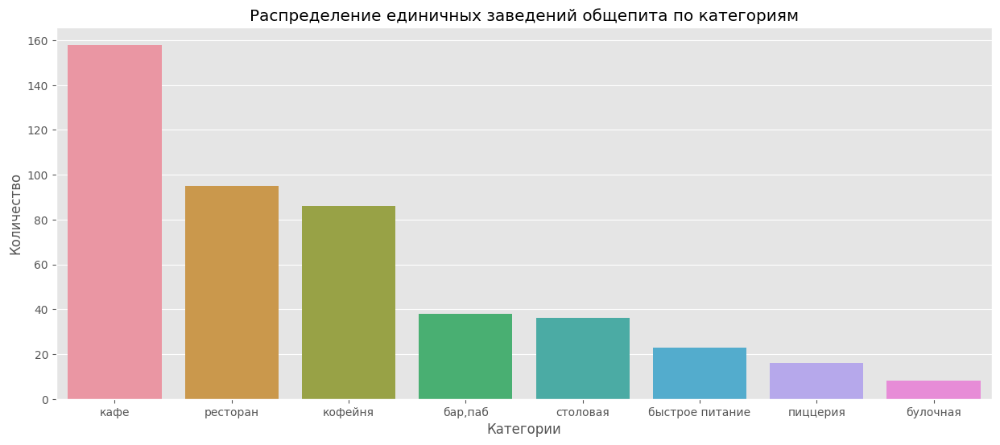

In [66]:
# Построим график распределения единичных заведений общепита по категориям
ax = sns.barplot(x='category', y='count', data=lonely_places_by_category)
plt.xlabel("Категории")
plt.ylabel("Количество")
plt.title("Распределение единичных заведений общепита по категориям")
ax.figure.set_size_inches(15, 6)

График показывает следующее: 
- единичные объекты общепита на улице в своем большинстве относятся к категории "кафе" - 158 заведений 
- чуть реже такие заведения относятся к категориям "ресторан"(95 заведений) и "кофейня"(86 заведения)
- реже всего единственные заведения встречаются из категории "булочная" - всего 8 заведений

In [67]:
# Отобразим все единичные заведения на улице на карте с помощью кластеров средствами библиотеки folium

# создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# создадим пустой кластер, добавим его на карту
marker_cluster = MarkerCluster().add_to(m)

# напишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}, {row['street']}",
    ).add_to(marker_cluster)

# применим функцию create_clusters() к каждой строке датафрейма
lonely_places.apply(create_clusters, axis=1)

# выводим карту
m

### Распределение среднего чека по районам Москвы

In [68]:
# Посчитаем медиану среднего чека для каждого района
middle_avg_bill_median = data.groupby ('district')['middle_avg_bill'].median().reset_index()
middle_avg_bill_median.columns = ['district', 'bill_median']
middle_avg_bill_median = middle_avg_bill_median.sort_values(by='bill_median', ascending=False)
middle_avg_bill_median

,district,bill_median
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [69]:
# Построем фоновую картограмму (хороплет) с полученными значениями для каждого района

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_median,
    columns=['district', 'bill_median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Распределение среднего чека по районам Москвы',
).add_to(m)

m

Наши расчеты и хороплет позволяют сделать следующие выводы:
- самые высокие значения среднего чека наблюдаются в ЦАО и ЗАО по 1000 рублей 
- меньше показатель среднего чека в районах СЗАО и САО, 700 рублей и 650 рублей 
- минимальное значение среднего чека зафиксировано в ЮВАО

### **Вывод** 

На этапе исследовательского анализа данных была проделана работа и сделаны следующие выводы:

1. Посмотрели на распределение заведений общепита по категориям:

- бОльшая часть заведений приходится на кафе и рестораны и кофейни - более 1000 заведений в каждой категории
- затем идут бары, пицерии и быстрое питание - более 500 заведений в каждой категории
- меньше 500 заведений в категориях столовая и булочная

2. С помощью сводной таблицы посчитали медианное количество посадочных мест по категориям и вывели график, который показал следующее:

- больше всего посадочных мест в ресторанах, что вполне логично, так как посетители могут и поесть и отдохнуть
- незначительно уступают по количеству посадочных мест бары и кофейни
- меньше всего посадочных мест в булочных и пиццериях, так как они рассчитаны на крастковременное пребывание посетителей

3. Рассмотрели соотношение сетевых и несетевых заведений общепита на рынке Москвы

Оказалось что несетевых заведений общественного питания гораздо больше - 62%, чем сетевых - 38%

4. Исследовали какие категории заведений чаще являются сетевыми
- чаще всего сетевыми бывают категории - булочная, пицерия и кофейня
- наиболее редко сетевые заведения встречаются в категориях быстрого питания, ресторанах, кафе, столовых и баров

5. Нашли и вывели топ-15 популярных сетей в Москве

- самым популярным заведением в Москве оказалась сеть кофеен "Шоколадница". У данной сети 115 заведений
- второе и третье место в рейтинге занимают пиццерии - "Домино'с Пицца" (76 заведений) и "Додо Пицца" (74 заведения)
- последнее место в топе-15 занимает сеть кофеен "Кофемания"
- больше всего из топ-15 на рынке присутствуют заведения из категории "кофейня"

6. Рассмотрели общее количество заведений и количество заведений каждой категории по районам

- лидером по количеству заведений является ЦАО. Также в данном округе представлены все категории, но больше всего ресторанов, кафе и кофеен. Кроме того, в ЦАО больше всего баров, по сравнению с другими районами. Это объясняется тем, что Центральный административный округ - это основное место скопления туристов.
- приблизительно одинаково распредидились по количеству заведений места у ЮАО, САО и СВАО
- меньше всего заведений общепита находится в СЗАО, причем преобладают здесь кафе (112 заведений) и рестораны (109 заведений)
- почти одинаковое количество заведений быстрого питания имеется во всех районах, за исключением Северо-Западного административного округа

7. Посмотрели на распределение средних рейтингов по категориям заведений и вывели фоновая картограмму со средним рейтингом заведений каждого района

- средний рейтинг заведений по категориям не сильно отличается
- разброс значений рейтинга практически отсутствует
- максимальное значение среднего рейтинга у баров - 4.38
- минимальное значение среднего рейтинга у заведений быстрого питания - 4
- самый высокий рейтинг у заведений общественного питания в ЦАО - 4,38
- незначительно отличается рейтинг у заведений в САО и СЗАО - 4,24 и 4,21 соответственно
- самый низкий рейтинг у объектов в ЮВАО - 4,1

8. Отобразили все заведения датасета на карте с помощью кластеров средствами библиотеки folium

9. Нашли топ-15 улиц по количеству заведений:

- лидером по размещению объектов общепита стала такая крупная улица, как проспект Мира. Причем, если сравнивать ее с другими улицами, то здесь больше всего и кафе, и ресторанов и кофеен
- в топ-15 улиц вошли самые крупные транспортные артериии Москвы: шоссе, проспекты и улицы

10. Нашли улицы, на которых находится только один объект общепита и построили круговую диаграмму

- единственные объекты общепита на улице в большинстве случаев оказались несетевыми.
- единичные объекты общепита на улице в своем большинстве относятся к категории "кафе" - 158 заведений
- чуть реже такие заведения относятся к категориям "ресторан" (95 заведений) и "кофейня" (86 заведения)
- реже всего единственные заведения встречаются из категории "булочная" - всего 8 заведений

11. Рассмотрели распределение среднего чека по районам Москвы и построили хороплет

- самые высокие значения среднего чека наблюдаются в ЦАО и ЗАО - по 1000 рублей
- меньше показатель среднего чека в районах СЗАО и САО, 700 рублей и 650 рублей 
- минимальное значение среднего чека зафиксировано в ЮВАО

## Детализация исследования: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

### Посчитаем сколько всего кофеен в датасете

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [70]:
# Посчитаем общее количество кофеен в датасете
coffee_houses = data.loc[data['category'] == 'кофейня']
coffee_houses['name'].count()

1396

In [71]:
# Посчитаем сколько кофеен в каждом районе
coffee_house_count = pd.DataFrame(coffee_houses \
                        .groupby(['district','category'], as_index=False) \
                        .count() \
                        .sort_values(by='name', ascending=False)
                      )[['district', 'name']]
coffee_house_count.columns = ['district', 'count']
coffee_house_count.reset_index(drop=True,inplace=True)
display(coffee_house_count)

,district,count
0,Центральный административный округ,422
1,Северный административный округ,191
2,Северо-Восточный административный округ,158
3,Западный административный округ,147
4,Южный административный округ,129
5,Восточный административный округ,105
6,Юго-Западный административный округ,95
7,Юго-Восточный административный округ,87
8,Северо-Западный административный округ,62


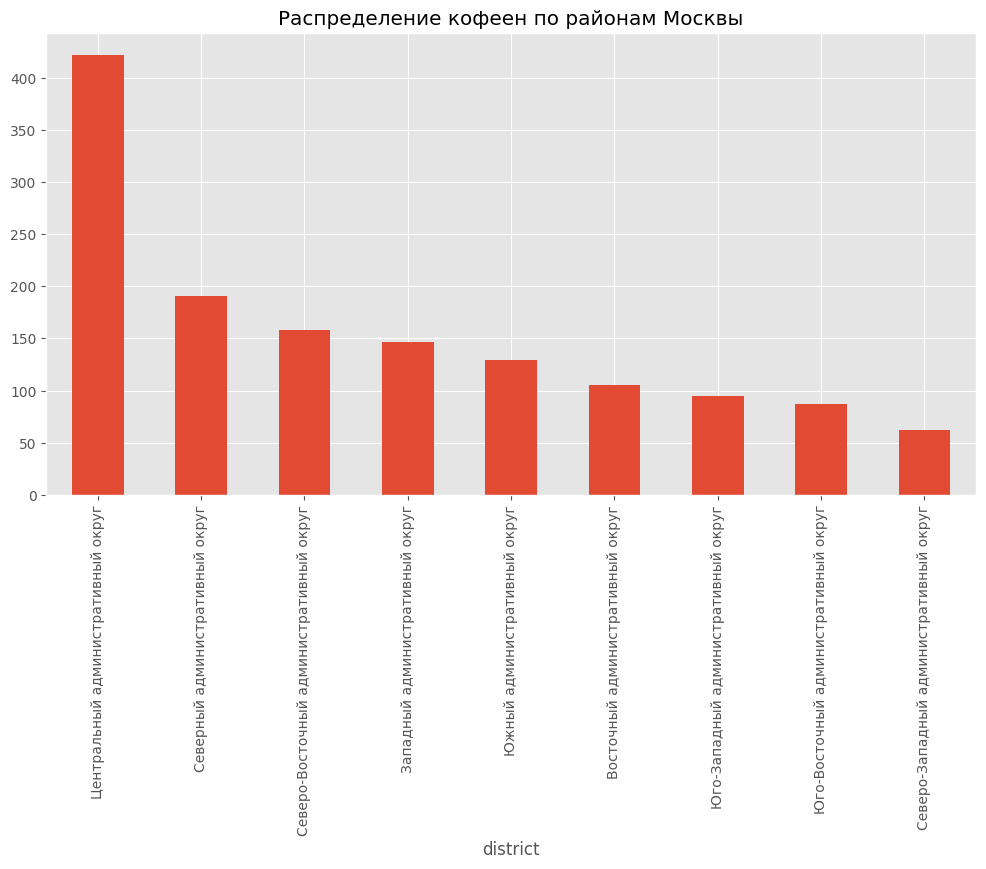

In [72]:
# Построим график распределения кофеен по районам Москвы
coffee_house_count.plot(kind='bar', figsize=(12,6), x='district', y='count', legend=False)
plt.title ('Распределение кофеен по районам Москвы')
plt.show()

По графику и расчетам можно сделать следующие выводы:
- всего в датасете 1396 кофеен. 
- лидером по количеству кофеен является Центральный Административный округ - 422 заведения
- вторым следует Северный административный округ - 191 заведения
- практически одинаковое количество кофеен в СВАО и ЗАО - 158 и 147 заведений
- меньше всего кофеен в СЗАО - 62 заведения

In [73]:
# Построим фоновую картограмму (хороплет) с полученными значениями для каждого района
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_house_count,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Распределение кофеен по районам Москвы',
).add_to(m)

m

Хоропалет подтверждает ранее сделанные выводы. 

### Рассмотрим есть ли круглосуточные кофейни

In [74]:
# Найдем и посчитаем круглосуточные кофейни 
coffee_houses.loc[coffee_houses['is_24_7'] == True, 'name'].count()

58

Как видно, в Москве есть круглосуточные кофейни, и их насчитывается 58 заведений

### Посмотрим какие у кофеен рейтинги и как они распределяются по районам

In [75]:
# Посмотрим статистику значений рейтинга у кофеен
coffee_houses['rating'].describe()

count    1396.000000
mean        4.277436
std         0.373167
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

In [76]:
# Посчитаем средний рейтинг кофеен по районам
coffee_houses_by_district = coffee_houses.groupby('district')['rating'].mean() \
    .reset_index().sort_values(by = 'rating', ascending = False)
coffee_houses_by_district

,district,rating
5,Центральный административный округ,4.336256
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.289529
0,Восточный административный округ,4.282857
7,Юго-Западный административный округ,4.282105
8,Южный административный округ,4.234884
6,Юго-Восточный административный округ,4.222989
3,Северо-Восточный административный округ,4.222785
1,Западный административный округ,4.193878


In [77]:
# Построим фоновую картограмму (хороплет) с полученными значениями для каждого района
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_houses_by_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам Москвы',
).add_to(m)

m

По расчетам и хороплету сделаем выводы:
- самые высокие рейтинги кофеен в ЦАО и СЗАО - 4,33 и 4,32
- незначительное отличие в рейтингах кофеен в САО, ЮЗАО и ВАО - 4,29, 4,28 и 4,28 соответственно 
- самый низкий рейтинг у кофеен в ЗАО - 4,19


### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [78]:
# Посчитаем среднюю от среднего чека одной чашки капучино для каждого района
middle_coffee_cup_mean = data.groupby ('district')['middle_coffee_cup'].mean() \
    .reset_index().sort_values(by = 'middle_coffee_cup', ascending = False)
middle_coffee_cup_mean.columns =  ['district', 'coffee_cup_mean']
middle_coffee_cup_mean

,district,coffee_cup_mean
1,Западный административный округ,189.640000
5,Центральный административный округ,187.725610
7,Юго-Западный административный округ,183.485714
3,Северо-Восточный административный округ,165.333333
2,Северный административный округ,165.090909
4,Северо-Западный административный округ,160.458333
8,Южный административный округ,157.826087
6,Юго-Восточный административный округ,147.676471
0,Восточный административный округ,142.880952


In [79]:
# Построим фоновую картограмму (хороплет) с полученными значениями для каждого района

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_coffee_cup_mean,
    columns=['district', 'coffee_cup_mean'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Распределение среднего чека чашки капучино по районам Москвы',
).add_to(m)

m

По расчетам и хороплету распределения среднего чека чашки капучино по районам можно сделать выводы:
- самый дорогой кофе в ЗАО, ЦАО и ЮЗАО - 190 рублей, 188 рублей и 183 рубля за чашку
- в СВАО, САО и СЗАО - средняя стоимость чашки капучино варьируется от 165 до 160 рублей
- в ЮАО и ЮВАО - средняя стоимость чашки кофе 158 и 148 рубля
- минимальная средняя стоимость чашки кофе зафиксирована в ВАО - 143 рубля

### **Вывод**

На этапе детализации исследования по открытию кофейни, мы проделали следующую работу:

1.Посчитали сколько всего кофеен в датасете и рассмотрели в каких районах их больше всего
- всего в датасете 1396 кофеен. 
- лидером по количеству кофеен является Центральный Административный округ - 422 заведения
- вторым следует Северный административный округ - 191 заведения
- практически одинаковое количество кофеен в СВАО и ЗАО - 158 и 147 заведений
- меньше всего кофеен в СЗАО - 62 заведения

2.Нашли круглосуточные кофейни, их в Москве - 58 заведений

3.Посмотрели какие у кофеен рейтинги и как они распределяются по районам(построили хороплет)
- самые высокие рейтинги кофеен в ЦАО и СЗАО - 4,33 и 4,32
- незначительное отличие в рейтингах кофеен в САО, ЮЗАО и ВАО - 4,29, 4,28 и 4,28 соответственно
- самый низкий рейтинг у кофеен в ЗАО - 4,19

4.Посчитали на какую стоимость чашки капучино стоит ориентироваться при открытии кофейни
- самый дорогой кофе в ЗАО, ЦАО и ЮЗАО - 190 рублей, 188 рублей и 183 рубля за чашку
- в СВАО, САО и СЗАО - средняя стоимость чашки капучино варьируется от 165 до 160 рублей
- в ЮАО и ЮВАО - средняя стоимость чашки кофе 158 и 148 рубля
- минимальная средняя стоимость чашки кофе зафиксирована в ВАО - 143 рубля


### **Рекомендации**

Основываясь на выводах, можно дать следующие рекомендации:

- Общий рынок общественного питания достаточно  конкурентный с численным  преобладанием кафе, ресторанов и кофеен
- При максимальной конкуренциии наиболее подходящим районом Москвы для открытия кофейни является центральный административный округ - здесь расположено больше всего кофеен, высокий средний чек и высокий средний рейтинг заведений
- При средней конкуренции наиболее удачным выбором будет Южный и Юго-Западные административные округа со средними показателями по количеству заведений, их рейтингу и среднего чека


## Презентация

Ссылка на презентацию (PDF) - https://disk.yandex.ru/i/3HPx1TYxz2jr6w